# Plotting

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import os
import glob

Saved figures/cartpole_small_batch.png
Saved figures/cartpole_large_batch.png
Saved figures/cheetah_eval_return.png
Saved figures/cheetah_baseline_loss.png
Saved figures/lunar_lander_gae.png
Saved figures/pendulum_comparison.png


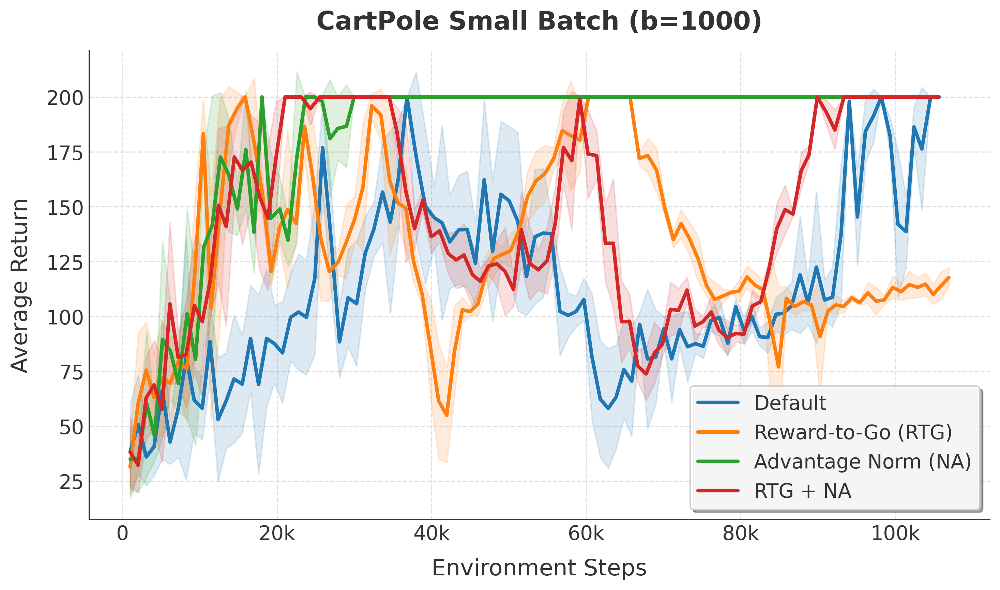

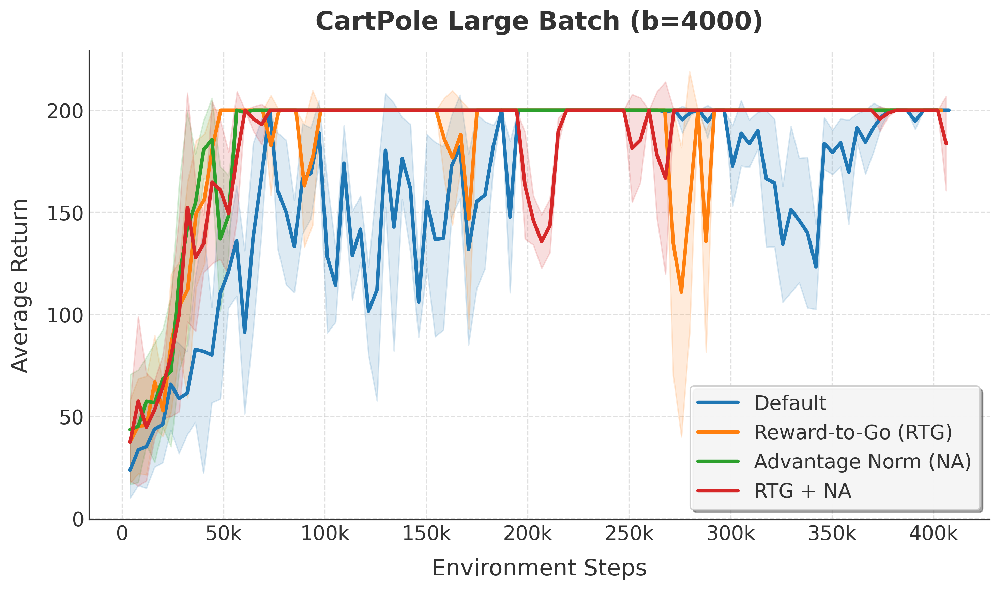

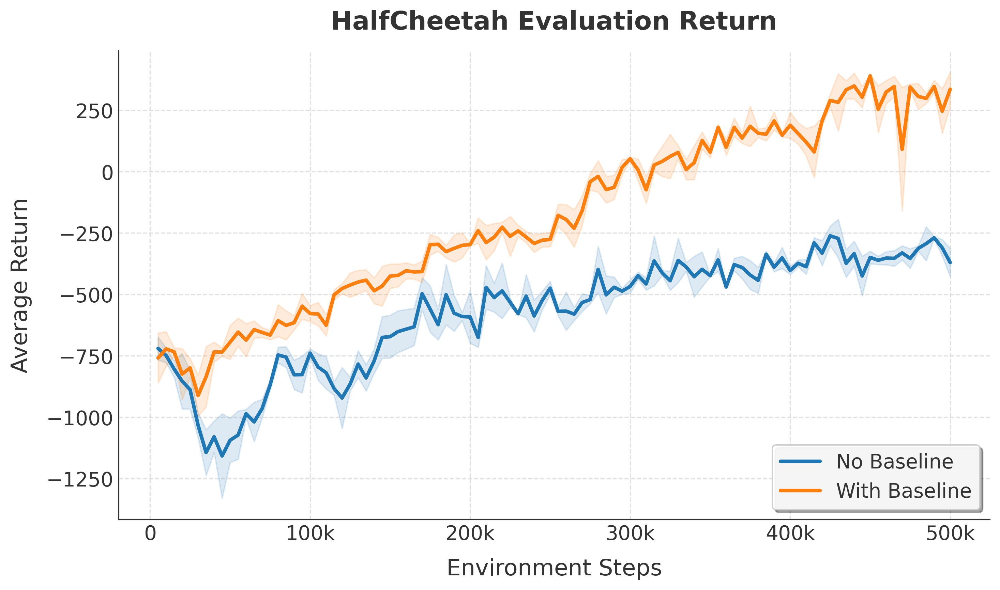

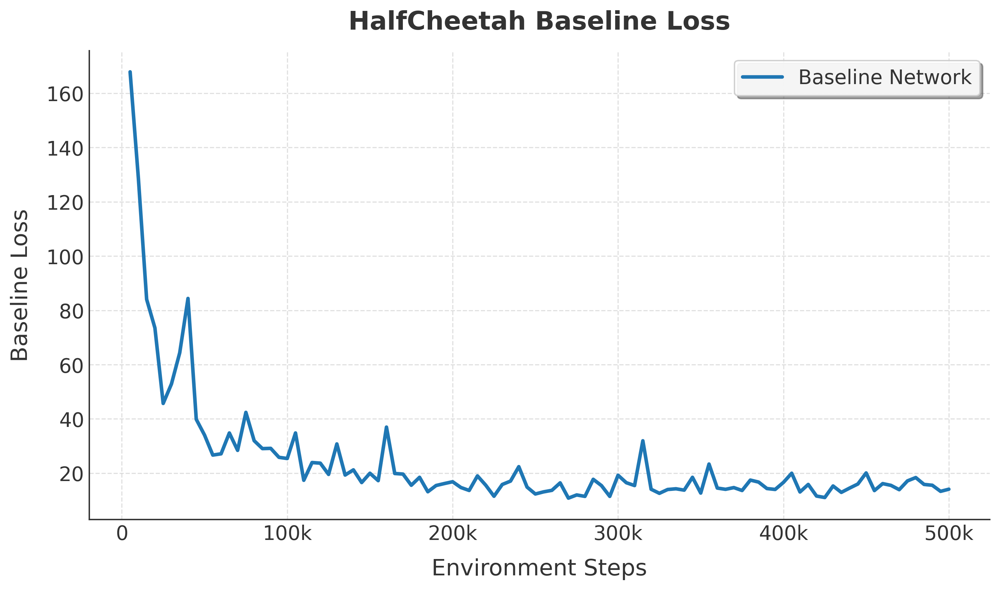

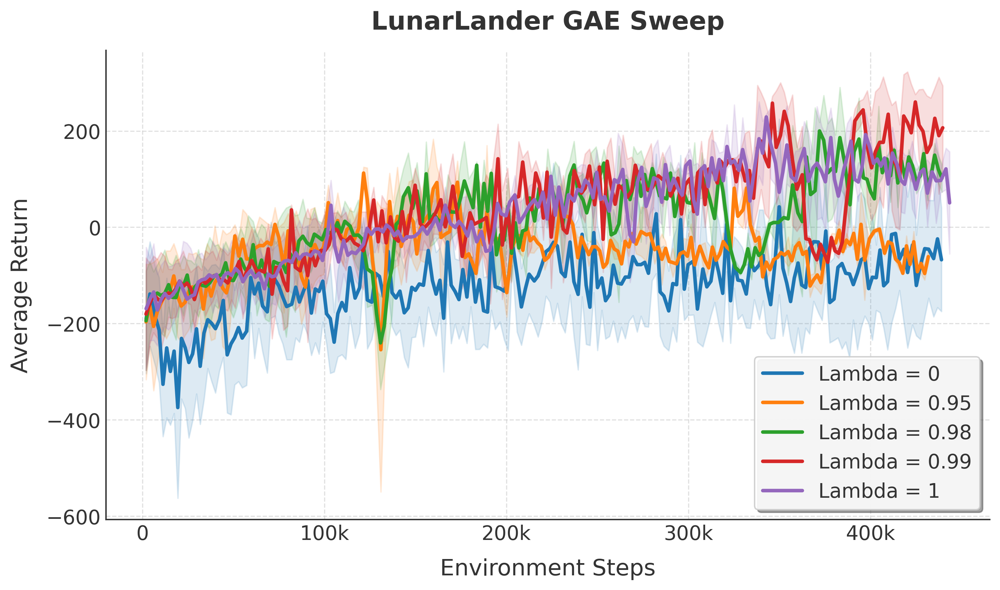

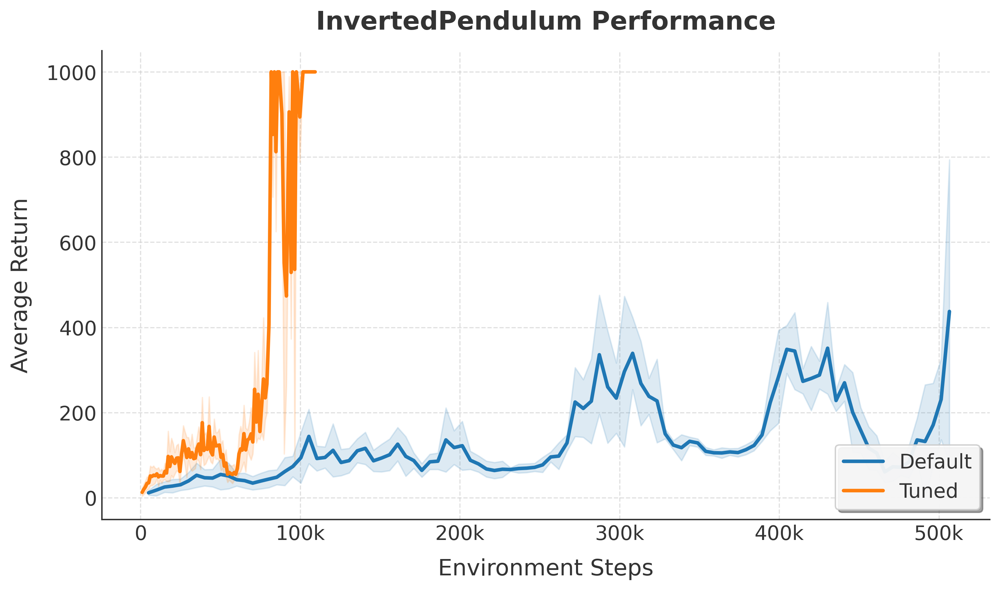

In [2]:
# ==========================================
# Publication-Ready Formatting Configuration
# ==========================================
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.size': 14,
    'axes.labelsize': 16,
    'axes.titlesize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 14,
    'legend.title_fontsize': 14,
    'lines.linewidth': 2.5,
    'figure.figsize': (10, 6),
    'figure.dpi': 300,        # High resolution for LaTeX
    'axes.edgecolor': '#333333',
    'text.color': '#333333',
    'axes.labelcolor': '#333333',
    'xtick.color': '#333333',
    'ytick.color': '#333333'
})

# Color palette for different lines
COLORS = sns.color_palette("tab10")

# Create figures directory if it doesn't exist
os.makedirs("figures", exist_ok=True)

def get_log_file(exp_prefix, base_dir="exp"):
    """Finds the log.csv file matching the experiment prefix."""
    search_pattern = os.path.join(base_dir, f"*{exp_prefix}*", "log.csv")
    matches = glob.glob(search_pattern)
    if not matches:
        print(f"Warning: No log.csv found for {exp_prefix}")
        return None
    return matches[0]

def plot_experiments(experiments, title, filename, y_col="Eval_AverageReturn", x_col="Train_EnvstepsSoFar", loc="lower right", base_dir="exp"):
    """Plots a set of experiments on a single figure with publication-quality formatting."""
    fig, ax = plt.subplots()
    plotted_any = False
    
    # Try to determine the std column based on the y_col name
    std_col = y_col.replace('Average', 'Std') if 'Average' in y_col else None
    
    for idx, (label, exp_prefix) in enumerate(experiments.items()):
        log_file = get_log_file(exp_prefix, base_dir)
        if log_file:
            df = pd.read_csv(log_file)
            if x_col in df.columns and y_col in df.columns:
                x = df[x_col]
                y = df[y_col]
                color = COLORS[idx % len(COLORS)]
                
                # Plot the main average line
                ax.plot(x, y, label=label, color=color, zorder=3)
                
                # Plot the shaded error band if the standard deviation column exists
                if std_col and std_col in df.columns:
                    std = df[std_col]
                    ax.fill_between(x, y - std, y + std, color=color, alpha=0.15, zorder=2)
                
                plotted_any = True
            else:
                print(f"Columns {x_col} or {y_col} not found in {log_file}")
                
    if plotted_any:
        ax.set_title(title, pad=15, fontweight='bold')
        
        # Format X-axis
        ax.set_xlabel("Environment Steps", labelpad=10)
        # Format X-axis tick labels to show as 'k' (e.g., 100k) for readability
        ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: f"{int(x/1000)}k" if x >= 1000 else f"{int(x)}"))
        
        # Format Y-axis
        y_label = "Average Return" if "Return" in y_col else y_col.replace("_", " ")
        ax.set_ylabel(y_label, labelpad=10)
        
        # Legend styling
        ax.legend(loc=loc, frameon=True, fancybox=True, shadow=True, 
                  framealpha=0.9, edgecolor='#CCCCCC')
        
        # Grid and spine styling
        ax.grid(True, linestyle='--', alpha=0.6, zorder=0)
        sns.despine(ax=ax)

        plt.tight_layout()
        plt.savefig(f"figures/{filename}.png", dpi=300)
        print(f"Saved figures/{filename}.png")

def main():
    # 1. CartPole Small Batch
    cartpole_small = {
        "Default": "CartPole-v0_cartpole_sd",
        "Reward-to-Go (RTG)": "CartPole-v0_cartpole_rtg_sd",
        "Advantage Norm (NA)": "CartPole-v0_cartpole_na_sd",
        "RTG + NA": "CartPole-v0_cartpole_rtg_na_sd"
    }
    plot_experiments(cartpole_small, "CartPole Small Batch (b=1000)", "cartpole_small_batch")

    # 2. CartPole Large Batch
    cartpole_large = {
        "Default": "CartPole-v0_cartpole_lb_sd",
        "Reward-to-Go (RTG)": "CartPole-v0_cartpole_lb_rtg_sd",
        "Advantage Norm (NA)": "CartPole-v0_cartpole_lb_na_sd",
        "RTG + NA": "CartPole-v0_cartpole_lb_rtg_na_sd"
    }
    plot_experiments(cartpole_large, "CartPole Large Batch (b=4000)", "cartpole_large_batch")

    # 3. HalfCheetah Eval Return
    cheetah_eval = {
        "No Baseline": "HalfCheetah-v4_cheetah_sd",
        "With Baseline": "HalfCheetah-v4_cheetah_baseline_sd"
    }
    plot_experiments(cheetah_eval, "HalfCheetah Evaluation Return", "cheetah_eval_return")

    # 4. HalfCheetah Baseline Loss
    cheetah_loss = {
        "Baseline Network": "HalfCheetah-v4_cheetah_baseline_sd"
    }
    # Note: Depending on how you logged it, the column might be 'Baseline Loss' or 'Baseline_Loss'
    plot_experiments(cheetah_loss, "HalfCheetah Baseline Loss", "cheetah_baseline_loss", y_col="Baseline Loss", loc="upper right")

    # 5. LunarLander GAE Lambda Sweep
    lunar_lander_gae = {
        "Lambda = 0": "LunarLander-v2_lunar_lander_lambda0_sd",
        "Lambda = 0.95": "LunarLander-v2_lunar_lander_lambda0.95_sd",
        "Lambda = 0.98": "LunarLander-v2_lunar_lander_lambda0.98_sd",
        "Lambda = 0.99": "LunarLander-v2_lunar_lander_lambda0.99_sd",
        "Lambda = 1": "LunarLander-v2_lunar_lander_lambda1_sd"
    }
    plot_experiments(lunar_lander_gae, "LunarLander GAE Sweep", "lunar_lander_gae")

    # 6. InvertedPendulum: Tuned vs Default
    # NOTE: You will need to change the prefix of the tuned one depending on what you named it!
    pendulum = {
        "Default": "InvertedPendulum-v4_pendulum_sd",
        "Tuned": "InvertedPendulum-v4_pendulum_rtg_baseline_na_gae_99_bs_1000"
    }
    plot_experiments(pendulum, "InvertedPendulum Performance", "pendulum_comparison")

if __name__ == "__main__":
    main()

Saved figures/cheetah_baseline_ablation_return.png
Saved figures/cheetah_baseline_ablation_loss.png


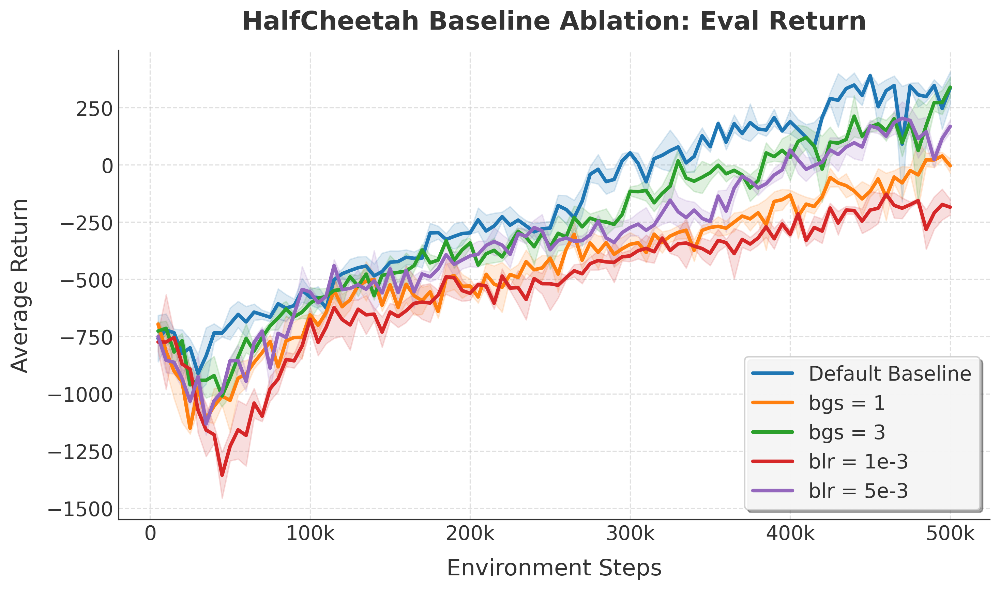

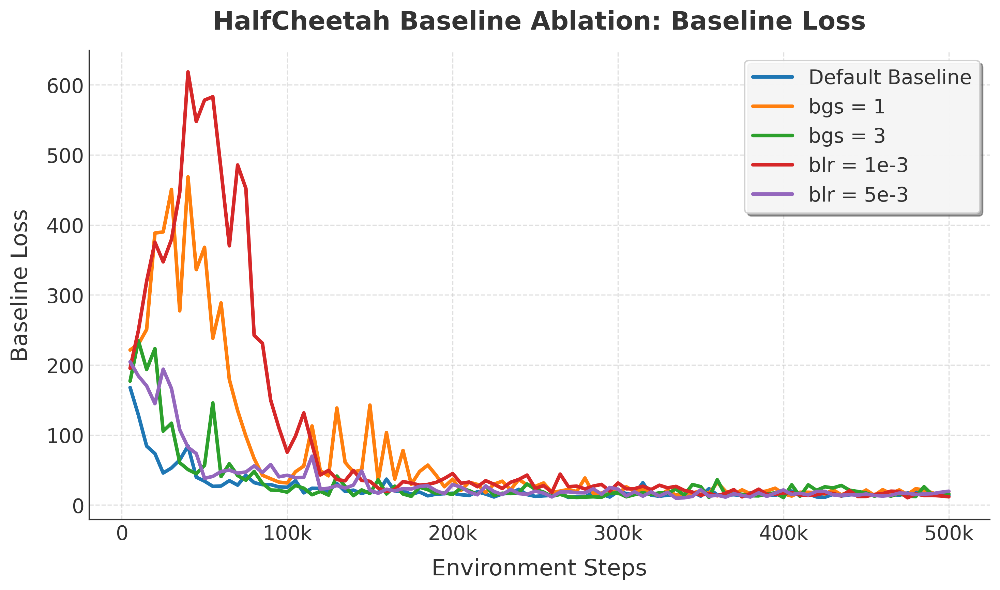

In [3]:
# ==========================================
# 1. Define your experiments dictionary
# ==========================================
ablation_experiments = {
    "Default Baseline": "HalfCheetah-v4_cheetah_baseline_sd",
    "bgs = 1": "HalfCheetah-v4_cheetah_baseline_bgs_1",
    "bgs = 3": "HalfCheetah-v4_cheetah_baseline_bgs_3",
    "blr = 1e-3": "HalfCheetah-v4_cheetah_baseline_blr_1e3",
    "blr = 5e-3": "HalfCheetah-v4_cheetah_baseline_blr_5e3"
}

# ==========================================
# 2. Plot the Evaluation Return
# ==========================================
plot_experiments(
    experiments=ablation_experiments,
    title="HalfCheetah Baseline Ablation: Eval Return",
    filename="cheetah_baseline_ablation_return",
    y_col="Eval_AverageReturn",
    x_col="Train_EnvstepsSoFar",
    loc="lower right",
    base_dir="myexp"
)

# ==========================================
# 3. Plot the Baseline Loss
# ==========================================
plot_experiments(
    experiments=ablation_experiments,
    title="HalfCheetah Baseline Ablation: Baseline Loss",
    filename="cheetah_baseline_ablation_loss",
    y_col="Baseline Loss",
    x_col="Train_EnvstepsSoFar",
    loc="upper right",
    base_dir="myexp"
)

Saved figures/extra_ultimate_sequential.png


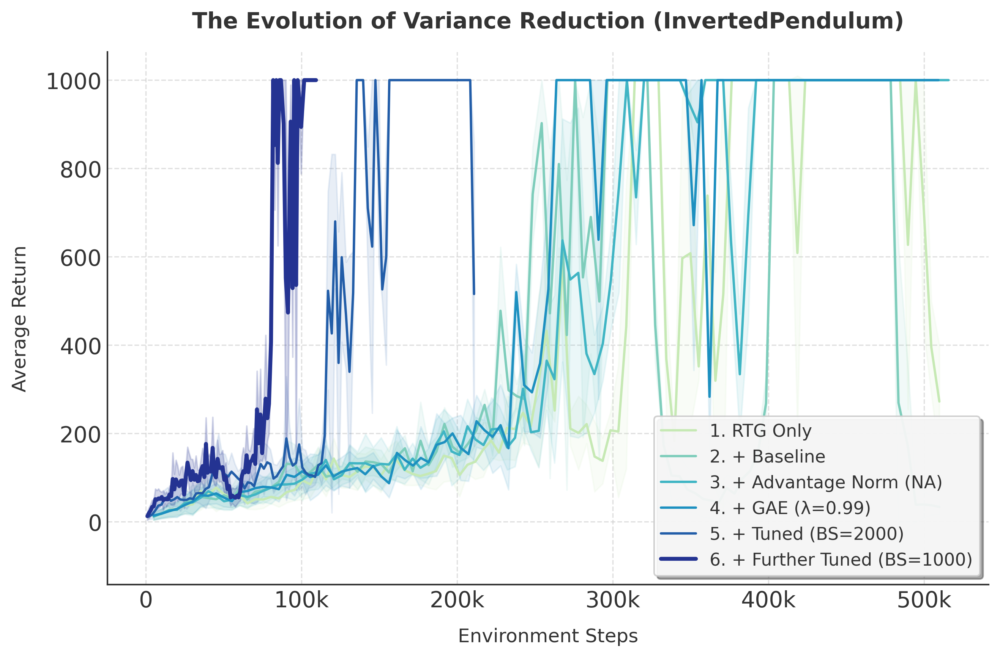

In [30]:
def plot_sequential_improvement(experiments, title, filename, y_col="Eval_AverageReturn", x_col="Train_EnvstepsSoFar", base_dir="myexp"):
    """Plots experiments using a sequential color palette to show additive improvements."""
    fig, ax = plt.subplots(figsize=(9, 6))
    plotted_any = False
    
    std_col = y_col.replace('Average', 'Std') if 'Average' in y_col else None
    
    # Use a sequential palette (e.g., Blues or Reds) to show progression
    # We use .reversed() or slice to get from lighter to darker colors
    colors = sns.color_palette("YlGnBu", len(experiments) + 1)[1:] 
    
    for idx, (label, exp_prefix) in enumerate(experiments.items()):
        log_file = get_log_file(exp_prefix, base_dir)
        if log_file:
            df = pd.read_csv(log_file)
            if x_col in df.columns and y_col in df.columns:
                x = df[x_col]
                y = df[y_col]
                color = colors[idx]
                
                # Make the final "best" line slightly thicker
                lw = 2.5 if idx == len(experiments) - 1 else 1.5
                ax.plot(x, y, label=label, color=color, zorder=3 + idx, linewidth=lw)
                
                if std_col and std_col in df.columns:
                    std = df[std_col]
                    # Make earlier steps more transparent so they don't block the final steps
                    alpha_val = 0.1 if idx < len(experiments) - 1 else 0.2
                    ax.fill_between(x, y - std, y + std, color=color, alpha=alpha_val, zorder=2)
                
                plotted_any = True
            else:
                print(f"Columns missing in {log_file}")
        else:
            print(f"Could not find log file for prefix: {exp_prefix}")
                
    if plotted_any:
        ax.set_title(title, pad=15, fontweight='bold', fontsize=14)
        ax.set_xlabel("Environment Steps", labelpad=10, fontsize=12)
        ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: f"{int(x/1000)}k" if x >= 1000 else f"{int(x)}"))
        
        y_label = "Average Return" if "Return" in y_col else y_col.replace("_", " ")
        ax.set_ylabel(y_label, labelpad=10, fontsize=12)
        
        # Legend styling
        ax.legend(loc="lower right", frameon=True, fancybox=True, shadow=True, 
                  framealpha=0.9, edgecolor='#CCCCCC', fontsize=11)
        
        ax.grid(True, linestyle='--', alpha=0.6, zorder=0)
        sns.despine(ax=ax)

        plt.tight_layout()
        os.makedirs("figures", exist_ok=True)
        plt.savefig(f"figures/{filename}.png", dpi=300)
        print(f"Saved figures/{filename}.png")

sequential_experiments = {
    "1. RTG Only": "pendulum_rtg_sd1",
    "2. + Baseline": "pendulum_rtg_baseline_sd1",
    "3. + Advantage Norm (NA)": "pendulum_rtg_baseline_na_sd1",
    "4. + GAE (\u03BB=0.99)": "pendulum_rtg_baseline_na_gae_99_sd1", # \u03BB is the lambda symbol
    "5. + Tuned (BS=2000)": "pendulum_rtg_baseline_na_gae_99_bs_2000",
    "6. + Further Tuned (BS=1000)": "pendulum_rtg_baseline_na_gae_99_bs_1000_sd1"
}

plot_sequential_improvement(
    experiments=sequential_experiments,
    title="The Evolution of Variance Reduction (InvertedPendulum)",
    filename="extra_ultimate_sequential",
    y_col="Eval_AverageReturn"
)

Saved figures/extra_batch_size_limits.png


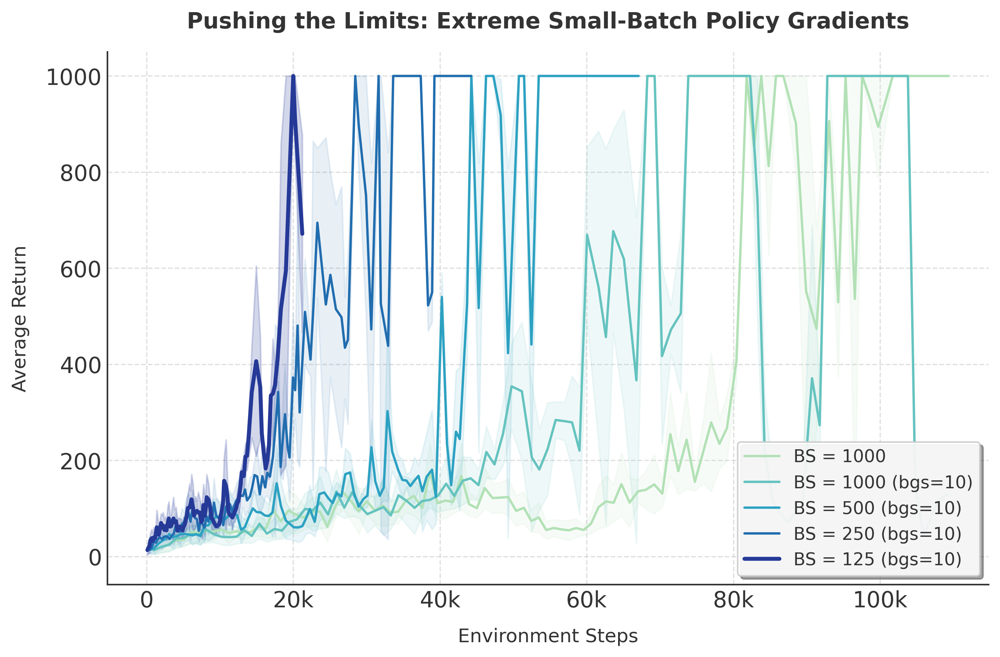

In [12]:
# ==========================================
# Define the Extreme Batch Size Ablation
# ==========================================
batch_size_experiments = {
    "BS = 1000": "pendulum_rtg_baseline_na_gae_99_bs_1000_sd1",
    "BS = 1000 (bgs=10)": "pendulum_rtg_baseline_na_gae_99_bs_1000_bgs_10",
    "BS = 500 (bgs=10)": "pendulum_rtg_baseline_na_gae_99_bs_500_bgs_10",
    "BS = 250 (bgs=10)": "pendulum_rtg_baseline_na_gae_99_bs_250_bgs_10",
    "BS = 125 (bgs=10)": "pendulum_rtg_baseline_na_gae_99_bs_125_bgs_10"
}

plot_sequential_improvement(
    experiments=batch_size_experiments,
    title="Pushing the Limits: Extreme Small-Batch Policy Gradients",
    filename="extra_batch_size_limits",
    y_col="Eval_AverageReturn"
)

Saved figures/extra_batch_size_limits.png


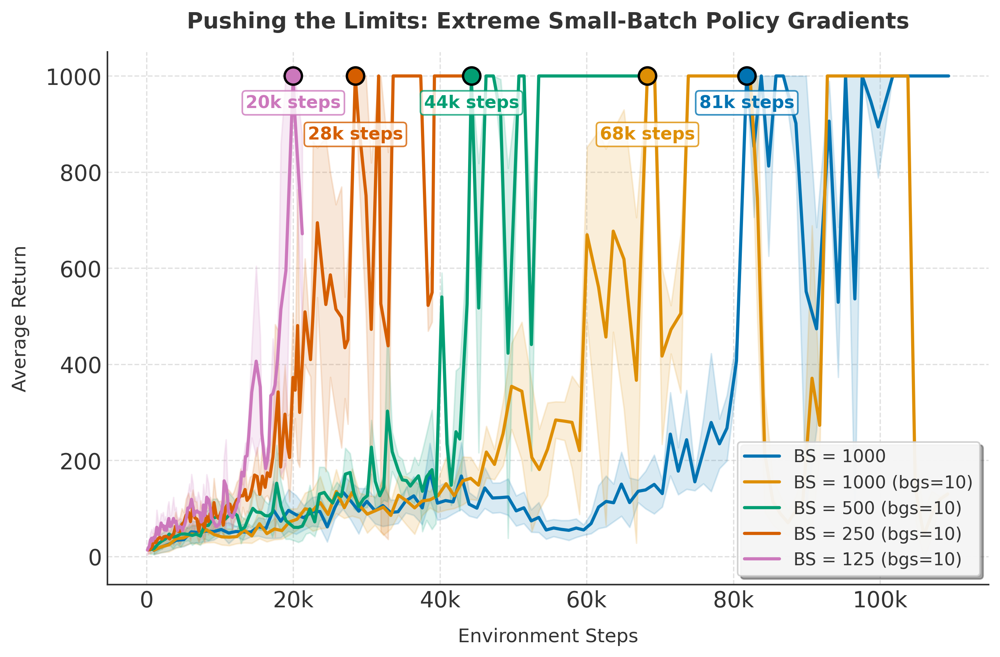

In [37]:
def plot_experiments_with_markers(experiments, title, filename, y_col="Eval_AverageReturn", x_col="Train_EnvstepsSoFar", base_dir="myexp", mod=2):
    fig, ax = plt.subplots(figsize=(9, 6))
    plotted_any = False
    
    std_col = y_col.replace('Average', 'Std') if 'Average' in y_col else None
    colors = sns.color_palette("colorblind", len(experiments))
    
    for idx, (label, exp_prefix) in enumerate(experiments.items()):
        log_file = get_log_file(exp_prefix, base_dir)
        if log_file:
            df = pd.read_csv(log_file)
            if x_col in df.columns and y_col in df.columns:
                x = df[x_col]
                y = df[y_col]
                color = colors[idx]
                
                # Plot the main line
                ax.plot(x, y, label=label, color=color, zorder=3, linewidth=2)
                
                # Plot shaded error band
                if std_col and std_col in df.columns:
                    std = df[std_col]
                    ax.fill_between(x, y - std, y + std, color=color, alpha=0.15, zorder=2)
                
                # --- NEW: Find and mark where it first hits 1000 ---
                hit_1000_mask = y >= 1000
                if hit_1000_mask.any():
                    first_hit_idx = hit_1000_mask.idxmax() # Gets the first index where condition is True
                    x_hit = x.loc[first_hit_idx]
                    y_hit = y.loc[first_hit_idx]
                    
                    # Draw a big dot
                    ax.scatter(x_hit, y_hit, color=color, s=120, zorder=5, edgecolor='black', linewidth=1.5)
                    
                    # Add text annotation next to the dot
                    ax.annotate(f'{int(x_hit/1000)}k steps', 
                                xy=(x_hit, y_hit), 
                                xytext=(-30, -20 - 20 * (idx % mod)), # Offset text slightly down and to the right
                                textcoords='offset points',
                                color=color,
                                fontweight='bold',
                                fontsize=11,
                                zorder=10,
                                bbox=dict(boxstyle="round,pad=0.2", fc="white", ec=color, alpha=0.8))
                # ---------------------------------------------------
                
                plotted_any = True
            else:
                print(f"Columns missing in {log_file}")
        else:
            print(f"Could not find log file for prefix: {exp_prefix}")
                
    if plotted_any:
        ax.set_title(title, pad=15, fontweight='bold', fontsize=14)
        ax.set_xlabel("Environment Steps", labelpad=10, fontsize=12)
        ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: f"{int(x/1000)}k" if x >= 1000 else f"{int(x)}"))
        
        y_label = "Average Return" if "Return" in y_col else y_col.replace("_", " ")
        ax.set_ylabel(y_label, labelpad=10, fontsize=12)
        
        ax.legend(loc="lower right", frameon=True, fancybox=True, shadow=True, 
                  framealpha=0.9, edgecolor='#CCCCCC', fontsize=11)
        
        ax.grid(True, linestyle='--', alpha=0.6, zorder=0)
        sns.despine(ax=ax)

        plt.tight_layout()
        os.makedirs("figures", exist_ok=True)
        plt.savefig(f"figures/{filename}.png", dpi=300)
        print(f"Saved figures/{filename}.png")

batch_size_experiments = {
    "BS = 1000": "pendulum_rtg_baseline_na_gae_99_bs_1000_sd1",
    "BS = 1000 (bgs=10)": "pendulum_rtg_baseline_na_gae_99_bs_1000_bgs_10",
    "BS = 500 (bgs=10)": "pendulum_rtg_baseline_na_gae_99_bs_500_bgs_10",
    "BS = 250 (bgs=10)": "pendulum_rtg_baseline_na_gae_99_bs_250_bgs_10",
    "BS = 125 (bgs=10)": "pendulum_rtg_baseline_na_gae_99_bs_125_bgs_10"
}

plot_experiments_with_markers(
    experiments=batch_size_experiments,
    title="Pushing the Limits: Extreme Small-Batch Policy Gradients",
    filename="extra_batch_size_limits",
    y_col="Eval_AverageReturn"
)

Saved figures/extra_ultimate_sequential.png


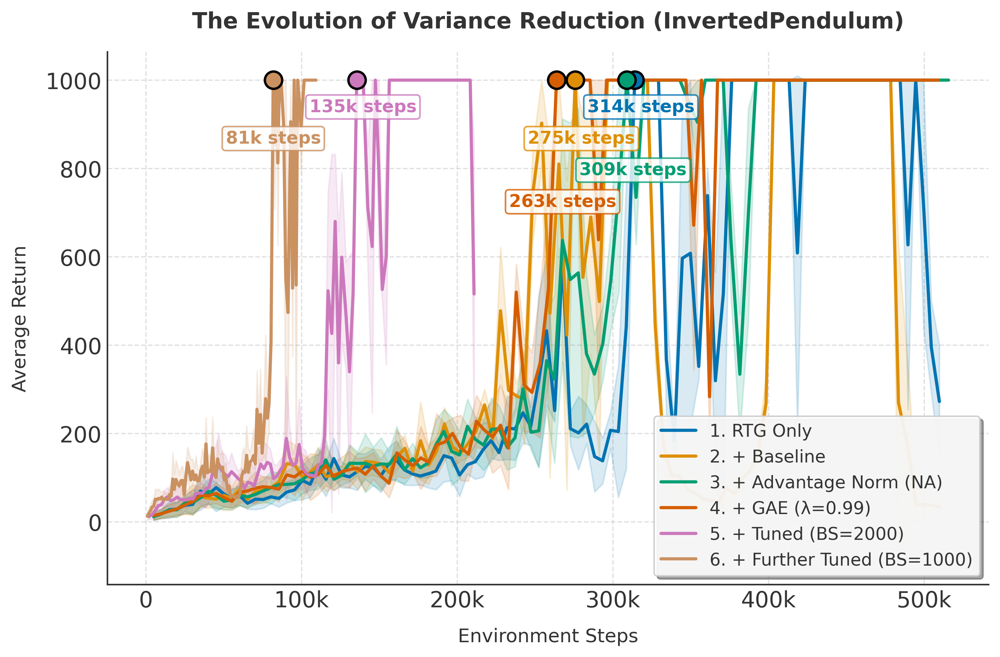

In [38]:
plot_experiments_with_markers(
    experiments=sequential_experiments,
    title="The Evolution of Variance Reduction (InvertedPendulum)",
    filename="extra_ultimate_sequential",
    y_col="Eval_AverageReturn",
    mod=4
)